In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd '/content/drive/MyDrive/ASSESSMENT'

/content/drive/MyDrive/ASSESSMENT


In [4]:
%ls

 app.py                  Combined_Stations_with_AQI.csv   Huairou_Rural.csv
'Assignment (6).ipynb'   Dongsi_Urban.csv                 Wanliu_Suburban.csv
 combined_output.csv     Gucheng_Industial_Hotspot.csv


# **MERGING CSV FILES**

> Add blockquote



MERGING CSV. FILES

In [5]:
import pandas as pd
import glob

# === List of your CSV file names ===
csv_files = ["Wanliu_Suburban.csv", "Huairou_Rural.csv", "Gucheng_Industial_Hotspot.csv", "Dongsi_Urban.csv",]

# === Read and concatenate them ===
df_combined = pd.concat([pd.read_csv(f) for f in csv_files], ignore_index=True)

# === Save to a new CSV ===
df_combined.to_csv("combined_output.csv", index=False)

print("CSV files combined and saved as 'combined_output.csv'")


CSV files combined and saved as 'combined_output.csv'


#CALCULATING THE AQI


In [6]:
import pandas as pd

# === AQI Calculation Functions ===
def calculate_aqi(concentration, breakpoints):
    for Clow, Chigh, Ilow, Ihigh in breakpoints:
        if Clow <= concentration <= Chigh:
            return round((Ihigh - Ilow) / (Chigh - Clow) * (concentration - Clow) + Ilow)
    return 0  # Return 0 instead of None

def classify_aqi(aqi):
    if pd.isna(aqi) or aqi < 0 or aqi > 500:
        return ("Invalid", "Gray", "Invalid AQI value")
    elif aqi <= 50:
        return ("Good", "Green", "Air quality is satisfactory.")
    elif aqi <= 100:
        return ("Moderate", "Yellow", "Acceptable; some pollutants may affect sensitive individuals.")
    elif aqi <= 150:
        return ("Unhealthy for Sensitive Groups", "Orange", "Sensitive people may experience health effects.")
    elif aqi <= 200:
        return ("Unhealthy", "Red", "Everyone may begin to experience health effects.")
    elif aqi <= 300:
        return ("Very Unhealthy", "Purple", "Health alert: serious effects for everyone.")
    else:
        return ("Hazardous", "Maroon", "Emergency conditions: serious risk to health for everyone.")

def aqi_for_all_pollutants(values):
    breakpoints_data = {
        'PM2.5': [(0.0, 12.0, 0, 50), (12.1, 35.4, 51, 100), (35.5, 55.4, 101, 150), (55.5, 150.4, 151, 200), (150.5, 250.4, 201, 300), (250.5, 350.4, 301, 400), (350.5, 500.4, 401, 500)],
        'PM10':  [(0, 54, 0, 50), (55, 154, 51, 100), (155, 254, 101, 150), (255, 354, 151, 200), (355, 424, 201, 300), (425, 504, 301, 400), (505, 604, 401, 500)],
        'NO2':   [(0, 53, 0, 50), (54, 100, 51, 100), (101, 360, 101, 150), (361, 649, 151, 200), (650, 1249, 201, 300), (1250, 1649, 301, 400), (1650, 2049, 401, 500)],
        'SO2':   [(0, 35, 0, 50), (36, 75, 51, 100), (76, 185, 101, 150), (186, 304, 151, 200), (305, 604, 201, 300), (605, 804, 301, 400), (805, 1004, 401, 500)],
        'CO':    [(0.0, 4.4, 0, 50), (4.5, 9.4, 51, 100), (9.5, 12.4, 101, 150), (12.5, 15.4, 151, 200), (15.5, 30.4, 201, 300), (30.5, 40.4, 301, 400), (40.5, 50.4, 401, 500)],
        'O3':    [(0, 54, 0, 50), (55, 70, 51, 100), (71, 85, 101, 150), (86, 105, 151, 200), (106, 200, 201, 300), (201, 300, 301, 400), (301, 400, 401, 500)]
    }

    individual_aqi = {}
    for pollutant, value in values.items():
        bp = breakpoints_data.get(pollutant)
        if bp and pd.notnull(value):
            individual_aqi[pollutant] = calculate_aqi(value, bp)

    if individual_aqi and all(val is None for val in individual_aqi.values()):
        overall_aqi = None
    else:
        overall_aqi = max(val for val in individual_aqi.values() if val is not None) if individual_aqi else None

    return overall_aqi, individual_aqi

# === Load your CSV ===
df = pd.read_csv("combined_output.csv")

# === Calculate AQI and Bucket row by row ===
aqi_values = []
aqi_buckets = []
aqi_colors = []
aqi_messages = []

for _, row in df.iterrows():
    pollutant_values = {
        'PM2.5': row.get('PM2.5'),
        'PM10': row.get('PM10'),
        'NO2': row.get('NO2'),
        'SO2': row.get('SO2'),
        'CO': row.get('CO'),
        'O3': row.get('O3')
    }
    overall_aqi, _ = aqi_for_all_pollutants(pollutant_values)
    bucket, color, message = classify_aqi(overall_aqi)

    aqi_values.append(overall_aqi)
    aqi_buckets.append(bucket)
    aqi_colors.append(color)
    aqi_messages.append(message)

# === Add results to DataFrame and save ===
df['AQI'] = aqi_values
df['AQI_Bucket'] = aqi_buckets
df['AQI_Color'] = aqi_colors
df['AQI_Message'] = aqi_messages

df.to_csv("Combined_Stations_with_AQI.csv", index=False)
print("AQI, categories, colors, and messages saved to 'Combined_Stations_with_AQI.csv'")

AQI, categories, colors, and messages saved to 'Combined_Stations_with_AQI.csv'


# READING DATASET

In [7]:
All_Stations_df = pd.read_csv('Combined_Stations_with_AQI.csv')# Replaced with the name of the file
All_Stations_df


 # shows the first 5 and last 5 rows together

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,PRES,DEWP,RAIN,wd,WSPM,station,AQI,AQI_Bucket,AQI_Color,AQI_Message
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,...,1023.0,-18.8,0.0,NNW,4.4,Wanliu,48.0,Good,Green,Air quality is satisfactory.
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,...,1023.2,-18.2,0.0,N,4.7,Wanliu,46.0,Good,Green,Air quality is satisfactory.
2,3,2013,3,1,2,3.0,6.0,NaN,19.0,400.0,...,1023.5,-18.2,0.0,NNW,5.6,Wanliu,51.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
3,4,2013,3,1,3,11.0,30.0,8.0,14.0,NaN,...,1024.5,-19.4,0.0,NW,3.1,Wanliu,46.0,Good,Green,Air quality is satisfactory.
4,5,2013,3,1,4,3.0,13.0,9.0,NaN,300.0,...,1025.2,-19.5,0.0,N,2.0,Wanliu,50.0,Good,Green,Air quality is satisfactory.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,35060,2017,2,28,19,16.0,51.0,3.0,29.0,400.0,...,1013.5,-16.2,0.0,NW,2.4,Dongsi,108.0,Unhealthy for Sensitive Groups,Orange,Sensitive people may experience health effects.
140252,35061,2017,2,28,20,18.0,45.0,3.0,43.0,500.0,...,1013.6,-15.1,0.0,WNW,0.9,Dongsi,63.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140253,35062,2017,2,28,21,23.0,58.0,5.0,61.0,700.0,...,1014.2,-13.3,0.0,NW,1.1,Dongsi,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140254,35063,2017,2,28,22,23.0,53.0,9.0,75.0,900.0,...,1014.4,-12.9,0.0,NNW,1.2,Dongsi,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...


In [8]:
All_Stations_df.head()#shows first 5 rows

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,PRES,DEWP,RAIN,wd,WSPM,station,AQI,AQI_Bucket,AQI_Color,AQI_Message
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,...,1023.0,-18.8,0.0,NNW,4.4,Wanliu,48.0,Good,Green,Air quality is satisfactory.
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,...,1023.2,-18.2,0.0,N,4.7,Wanliu,46.0,Good,Green,Air quality is satisfactory.
2,3,2013,3,1,2,3.0,6.0,NaN,19.0,400.0,...,1023.5,-18.2,0.0,NNW,5.6,Wanliu,51.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
3,4,2013,3,1,3,11.0,30.0,8.0,14.0,NaN,...,1024.5,-19.4,0.0,NW,3.1,Wanliu,46.0,Good,Green,Air quality is satisfactory.
4,5,2013,3,1,4,3.0,13.0,9.0,NaN,300.0,...,1025.2,-19.5,0.0,N,2.0,Wanliu,50.0,Good,Green,Air quality is satisfactory.


In [9]:
All_Stations_df.tail()#shows last 5 rows

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,PRES,DEWP,RAIN,wd,WSPM,station,AQI,AQI_Bucket,AQI_Color,AQI_Message
140251,35060,2017,2,28,19,16.0,51.0,3.0,29.0,400.0,...,1013.5,-16.2,0.0,NW,2.4,Dongsi,108.0,Unhealthy for Sensitive Groups,Orange,Sensitive people may experience health effects.
140252,35061,2017,2,28,20,18.0,45.0,3.0,43.0,500.0,...,1013.6,-15.1,0.0,WNW,0.9,Dongsi,63.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140253,35062,2017,2,28,21,23.0,58.0,5.0,61.0,700.0,...,1014.2,-13.3,0.0,NW,1.1,Dongsi,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140254,35063,2017,2,28,22,23.0,53.0,9.0,75.0,900.0,...,1014.4,-12.9,0.0,NNW,1.2,Dongsi,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140255,35064,2017,2,28,23,30.0,71.0,11.0,87.0,1200.0,...,1014.1,-15.9,0.0,NNE,1.3,Dongsi,89.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...


# Exploratory Data Analysis

Step 2: **Understand the Data Structure**

In [10]:
All_Stations_df.shape

(140256, 22)

In [11]:
All_Stations_df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'AQI', 'AQI_Bucket', 'AQI_Color', 'AQI_Message'],
      dtype='object')

In [12]:
All_Stations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 22 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   No           140256 non-null  int64  
 1   year         140256 non-null  int64  
 2   month        140256 non-null  int64  
 3   day          140256 non-null  int64  
 4   hour         140256 non-null  int64  
 5   PM2.5        137525 non-null  float64
 6   PM10         138261 non-null  float64
 7   SO2          137531 non-null  float64
 8   NO2          135278 non-null  float64
 9   CO           132424 non-null  float64
 10  O3           135605 non-null  float64
 11  TEMP         140114 non-null  float64
 12  PRES         140113 non-null  float64
 13  DEWP         140112 non-null  float64
 14  RAIN         140118 non-null  float64
 15  wd           139594 non-null  object 
 16  WSPM         140137 non-null  float64
 17  station      140256 non-null  object 
 18  AQI          138656 non-

In [13]:
All_Stations_df.isnull().sum()

,0
No,0
year,0
month,0
day,0
hour,0
PM2.5,2731
PM10,1995
SO2,2725
NO2,4978
CO,7832


In [14]:
All_Stations_df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,AQI
count,140256.000,140256.000000,140256.000000,140256.000000,140256.000000,137525.000000,138261.000000,137531.000000,135278.000000,132424.000000,135605.000000,140114.000000,140113.000000,140112.000000,140118.000000,140137.000000,138656.000000
mean,17532.500,2014.662560,6.522930,15.729637,11.500000,80.787633,107.831910,16.108619,51.917635,1247.705756,55.960789,13.352664,1010.019103,2.640897,0.066169,1.589366,167.612112
std,10122.141,1.177201,3.448715,8.800123,6.922211,81.104627,93.499284,21.627111,36.087915,1157.289263,56.377926,11.476537,10.367816,13.836908,0.843583,1.200826,83.396485
min,1.000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.800000,-43.400000,0.000000,0.000000,3.000000
25%,8766.750,2014.000000,4.000000,8.000000,5.750000,21.000000,37.000000,2.856000,23.000000,500.000000,10.000000,3.000000,1001.600000,-8.900000,0.000000,0.800000,102.000000
50%,17532.500,2015.000000,7.000000,16.000000,11.500000,56.000000,86.000000,8.000000,45.000000,900.000000,43.000000,14.300000,1009.700000,3.200000,0.000000,1.300000,164.000000
75%,26298.250,2016.000000,10.000000,23.000000,17.250000,112.000000,151.000000,20.000000,73.497400,1500.000000,80.000000,23.100000,1018.200000,15.400000,0.000000,2.100000,210.000000
max,35064.000,2017.000000,12.000000,31.000000,23.000000,957.000000,994.000000,500.000000,276.000000,10000.000000,1071.000000,41.600000,1042.000000,29.100000,72.500000,12.900000,500.000000


In [15]:
All_Stations_df.describe(include=['object'])

,wd,station,AQI_Bucket,AQI_Color,AQI_Message
count,139594,140256,140256,140256,140256
unique,16,4,7,7,7
top,NE,Wanliu,Unhealthy,Red,Everyone may begin to experience health effects.
freq,15614,35064,44947,44947,44947


# **DATA CLEANING**

In [16]:
#Handle missing values:
#Drop rows (if needed):
Cleaned_df = All_Stations_df.dropna()
display(Cleaned_df)

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,PRES,DEWP,RAIN,wd,WSPM,station,AQI,AQI_Bucket,AQI_Color,AQI_Message
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,...,1023.0,-18.8,0.0,NNW,4.4,Wanliu,48.0,Good,Green,Air quality is satisfactory.
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,...,1023.2,-18.2,0.0,N,4.7,Wanliu,46.0,Good,Green,Air quality is satisfactory.
5,6,2013,3,1,5,3.0,6.0,8.0,17.0,300.0,...,1025.6,-19.6,0.0,N,3.7,Wanliu,50.0,Good,Green,Air quality is satisfactory.
6,7,2013,3,1,6,3.0,3.0,10.0,21.0,300.0,...,1026.5,-19.1,0.0,NNE,2.5,Wanliu,48.0,Good,Green,Air quality is satisfactory.
7,8,2013,3,1,7,3.0,6.0,11.0,26.0,300.0,...,1027.4,-19.1,0.0,NNW,3.8,Wanliu,44.0,Good,Green,Air quality is satisfactory.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,35060,2017,2,28,19,16.0,51.0,3.0,29.0,400.0,...,1013.5,-16.2,0.0,NW,2.4,Dongsi,108.0,Unhealthy for Sensitive Groups,Orange,Sensitive people may experience health effects.
140252,35061,2017,2,28,20,18.0,45.0,3.0,43.0,500.0,...,1013.6,-15.1,0.0,WNW,0.9,Dongsi,63.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140253,35062,2017,2,28,21,23.0,58.0,5.0,61.0,700.0,...,1014.2,-13.3,0.0,NW,1.1,Dongsi,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140254,35063,2017,2,28,22,23.0,53.0,9.0,75.0,900.0,...,1014.4,-12.9,0.0,NNW,1.2,Dongsi,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

**FINDING NUMBER OF CITIES IN THE DATASET**

In [18]:
cities = All_Stations_df['station'].value_counts()
print(f'Total number of cities in the dataset : {len(cities)}')
cities

Total number of cities in the dataset : 4


,count
station,
Wanliu,35064
Huairou,35064
Gucheng,35064
Dongsi,35064


**CREATING A COLUMN DATE AND CONVERTING TO YY/MM/DD**

In [19]:
All_Stations_df['Date'] = pd.to_datetime(All_Stations_df[['year', 'month', 'day']])
All_Stations_df['Date']

,Date
0,2013-03-01
1,2013-03-01
2,2013-03-01
3,2013-03-01
4,2013-03-01
...,...
140251,2017-02-28
140252,2017-02-28
140253,2017-02-28
140254,2017-02-28


In [20]:
All_Stations_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,DEWP,RAIN,wd,WSPM,station,AQI,AQI_Bucket,AQI_Color,AQI_Message,Date
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,...,-18.8,0.0,NNW,4.4,Wanliu,48.0,Good,Green,Air quality is satisfactory.,2013-03-01
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,...,-18.2,0.0,N,4.7,Wanliu,46.0,Good,Green,Air quality is satisfactory.,2013-03-01
2,3,2013,3,1,2,3.0,6.0,NaN,19.0,400.0,...,-18.2,0.0,NNW,5.6,Wanliu,51.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...,2013-03-01
3,4,2013,3,1,3,11.0,30.0,8.0,14.0,NaN,...,-19.4,0.0,NW,3.1,Wanliu,46.0,Good,Green,Air quality is satisfactory.,2013-03-01
4,5,2013,3,1,4,3.0,13.0,9.0,NaN,300.0,...,-19.5,0.0,N,2.0,Wanliu,50.0,Good,Green,Air quality is satisfactory.,2013-03-01


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 22 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   No           140256 non-null  int64  
 1   year         140256 non-null  int64  
 2   month        140256 non-null  int64  
 3   day          140256 non-null  int64  
 4   hour         140256 non-null  int64  
 5   PM2.5        137525 non-null  float64
 6   PM10         138261 non-null  float64
 7   SO2          137531 non-null  float64
 8   NO2          135278 non-null  float64
 9   CO           132424 non-null  float64
 10  O3           135605 non-null  float64
 11  TEMP         140114 non-null  float64
 12  PRES         140113 non-null  float64
 13  DEWP         140112 non-null  float64
 14  RAIN         140118 non-null  float64
 15  wd           139594 non-null  object 
 16  WSPM         140137 non-null  float64
 17  station      140256 non-null  object 
 18  AQI          138656 non-

**LOOKING AT MISSING VALUES**

In [22]:
# Missing values
def missing_values_table(All_Stations_df):
        # Total missing values
        mis_val = All_Stations_df.isnull().sum()

        # Percentage of missing values
        mis_val_percent = 100 *  All_Stations_df.isnull().sum() / len(df)

        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        print(mis_val_table)

        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns.sort_values(
        '% of Total Values', ascending=False)

        # Return the dataframe with missing information
        return mis_val_table_ren_columns

missing_values= missing_values_table( All_Stations_df)
missing_values.style.background_gradient(cmap='Blues')

                0         1
No              0  0.000000
year            0  0.000000
month           0  0.000000
day             0  0.000000
hour            0  0.000000
PM2.5        2731  1.947154
PM10         1995  1.422399
SO2          2725  1.942876
NO2          4978  3.549224
CO           7832  5.584075
O3           4651  3.316079
TEMP          142  0.101243
PRES          143  0.101956
DEWP          144  0.102669
RAIN          138  0.098392
wd            662  0.471994
WSPM          119  0.084845
station         0  0.000000
AQI          1600  1.140771
AQI_Bucket      0  0.000000
AQI_Color       0  0.000000
AQI_Message     0  0.000000
Date            0  0.000000


,Missing Values,% of Total Values
CO,7832,5.584075
NO2,4978,3.549224
O3,4651,3.316079
PM2.5,2731,1.947154
SO2,2725,1.942876
PM10,1995,1.422399
AQI,1600,1.140771
wd,662,0.471994
DEWP,144,0.102669
PRES,143,0.101956


In [23]:
df['PM2.5']=df['PM2.5']
df['PM10']= df['PM10']
df['Nitrous Dioxide']=df['NO2']
df['Carbon Monoxide']=df['CO']
df['Sulphur Dioxide']=df['SO2']
df['Ozone']=df['O3']
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,WSPM,station,AQI,AQI_Bucket,AQI_Color,AQI_Message,Nitrous Dioxide,Carbon Monoxide,Sulphur Dioxide,Ozone
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,...,4.4,Wanliu,48.0,Good,Green,Air quality is satisfactory.,28.0,400.0,6.0,52.0
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,...,4.7,Wanliu,46.0,Good,Green,Air quality is satisfactory.,28.0,400.0,6.0,50.0
2,3,2013,3,1,2,3.0,6.0,NaN,19.0,400.0,...,5.6,Wanliu,51.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...,19.0,400.0,NaN,55.0
3,4,2013,3,1,3,11.0,30.0,8.0,14.0,NaN,...,3.1,Wanliu,46.0,Good,Green,Air quality is satisfactory.,14.0,NaN,8.0,NaN
4,5,2013,3,1,4,3.0,13.0,9.0,NaN,300.0,...,2.0,Wanliu,50.0,Good,Green,Air quality is satisfactory.,NaN,300.0,9.0,54.0


**CREATING NEW DATAFRAME WITH AIR QUALITIES**

In [24]:
selected_columns = ['station', 'Date', 'month', 'year','PM2.5','PM10', 'SO2','NO2', 'CO', 'O3','TEMP','DEWP','PRES','RAIN','WSPM','AQI','AQI_Bucket','AQI_Color','AQI_Message']

# Create a new DataFrame with only the selected columns
New_df = All_Stations_df[selected_columns]

# Display the first few rows of the new DataFrame
New_df.head()

,station,Date,month,year,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,DEWP,PRES,RAIN,WSPM,AQI,AQI_Bucket,AQI_Color,AQI_Message
0,Wanliu,2013-03-01,3,2013,8.0,8.0,6.0,28.0,400.0,52.0,-0.7,-18.8,1023.0,0.0,4.4,48.0,Good,Green,Air quality is satisfactory.
1,Wanliu,2013-03-01,3,2013,9.0,9.0,6.0,28.0,400.0,50.0,-1.1,-18.2,1023.2,0.0,4.7,46.0,Good,Green,Air quality is satisfactory.
2,Wanliu,2013-03-01,3,2013,3.0,6.0,NaN,19.0,400.0,55.0,-1.1,-18.2,1023.5,0.0,5.6,51.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
3,Wanliu,2013-03-01,3,2013,11.0,30.0,8.0,14.0,NaN,NaN,-1.4,-19.4,1024.5,0.0,3.1,46.0,Good,Green,Air quality is satisfactory.
4,Wanliu,2013-03-01,3,2013,3.0,13.0,9.0,NaN,300.0,54.0,-2.0,-19.5,1025.2,0.0,2.0,50.0,Good,Green,Air quality is satisfactory.


In [25]:
New_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   station      140256 non-null  object        
 1   Date         140256 non-null  datetime64[ns]
 2   month        140256 non-null  int64         
 3   year         140256 non-null  int64         
 4   PM2.5        137525 non-null  float64       
 5   PM10         138261 non-null  float64       
 6   SO2          137531 non-null  float64       
 7   NO2          135278 non-null  float64       
 8   CO           132424 non-null  float64       
 9   O3           135605 non-null  float64       
 10  TEMP         140114 non-null  float64       
 11  DEWP         140112 non-null  float64       
 12  PRES         140113 non-null  float64       
 13  RAIN         140118 non-null  float64       
 14  WSPM         140137 non-null  float64       
 15  AQI          138656 non-null  floa

**CHECKING MISSING VALUES FOR THE NEW DATAFRAME WITH SESLECTED COLUMNS**

In [26]:
# Missing values
def missing_values_table(New_df):
        # Total missing values
        mis_val = New_df.isnull().sum()

        # Percentage of missing values
        mis_val_percent = 100 * New_df.isnull().sum() / len(New_df)

        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table

        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns.sort_values(
        '% of Total Values', ascending=False)

        # Return the dataframe with missing information
        return mis_val_table_ren_columns

missing_values= missing_values_table(New_df)
missing_values.style.background_gradient(cmap='Greens')

,Missing Values,% of Total Values
CO,7832,5.584075
NO2,4978,3.549224
O3,4651,3.316079
PM2.5,2731,1.947154
SO2,2725,1.942876
PM10,1995,1.422399
AQI,1600,1.140771
DEWP,144,0.102669
PRES,143,0.101956
TEMP,142,0.101243


**IMPUTING MISSING VALUES**


**Mean** :
Finding the mean and replacing missing values with the mean


In [27]:
AirQualities= ['PM2.5','PM10','SO2','NO2', 'CO', 'O3','TEMP','DEWP','PRES','RAIN','WSPM','AQI']
AirQualities_df= New_df.groupby(['year','month','station'])[AirQualities].mean().reset_index()
AirQualities_df

,year,month,station,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,DEWP,PRES,RAIN,WSPM,AQI
0,2013,3,Dongsi,108.432032,131.022911,39.831952,76.904376,1529.192616,59.489526,6.256989,-7.030511,1014.456855,0.020968,1.969624,191.382234
1,2013,3,Gucheng,108.841398,146.453315,38.202755,76.913542,1624.285513,59.124166,6.329032,-6.514785,1010.526075,0.020161,1.427554,190.342742
2,2013,3,Huairou,98.299169,117.998650,33.073560,51.701720,1202.575071,61.879593,4.819624,-7.575000,1009.515188,0.017473,2.030511,179.905914
3,2013,3,Wanliu,110.272849,145.587162,43.533330,88.493135,1684.334795,39.668154,6.053629,-5.729435,1012.547446,0.026210,1.997849,178.142473
4,2013,4,Dongsi,65.273992,98.572222,22.404388,43.961095,966.527697,69.612200,12.632361,-3.778056,1009.933056,0.012222,2.571389,171.512500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2017,1,Wanliu,115.932432,133.454054,20.237197,75.056604,2143.895748,30.475034,-1.267553,-12.931105,1024.507572,0.000136,1.889824,174.025572
188,2017,2,Dongsi,76.538103,103.195122,19.607634,51.419847,1183.128834,44.651908,2.661533,-13.627679,1022.020585,0.006101,1.953869,151.254573
189,2017,2,Gucheng,72.859112,98.201835,19.623077,54.538222,1292.735703,33.124043,2.365717,-14.643006,1018.290179,0.005804,2.072768,132.509174
190,2017,2,Huairou,58.036474,72.569697,10.316109,35.940819,1028.353659,58.382040,0.859921,-13.763542,1016.851488,0.006845,2.037798,157.724242


In [28]:
New_df['PM2.5']=New_df['PM2.5'].fillna((New_df['PM2.5'].median()))
New_df['PM10']=New_df['PM10'].fillna((New_df['PM10'].median()))
New_df['SO2']=New_df['SO2'].fillna((New_df['SO2'].median()))
New_df['NO2']=New_df['NO2'].fillna((New_df['NO2'].median()))
New_df['CO']=New_df['CO'].fillna((New_df['CO'].median()))
New_df['O3']=New_df['O3'].fillna((New_df['O3'].median()))
New_df['AQI']=New_df['AQI'].fillna((New_df['AQI'].median()))
New_df['TEMP']=New_df['TEMP'].fillna((New_df['TEMP'].median()))
New_df['RAIN']=New_df['RAIN'].fillna((New_df['RAIN'].median()))
New_df['PRES']=New_df['PRES'].fillna((New_df['PRES'].median()))
New_df['DEWP']=New_df['DEWP'].fillna((New_df['DEWP'].median()))
New_df['WSPM']=New_df['WSPM'].fillna((New_df['WSPM'].median()))

In [29]:
New_df

,station,Date,month,year,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,DEWP,PRES,RAIN,WSPM,AQI,AQI_Bucket,AQI_Color,AQI_Message
0,Wanliu,2013-03-01,3,2013,8.0,8.0,6.0,28.0,400.0,52.0,-0.7,-18.8,1023.0,0.0,4.4,48.0,Good,Green,Air quality is satisfactory.
1,Wanliu,2013-03-01,3,2013,9.0,9.0,6.0,28.0,400.0,50.0,-1.1,-18.2,1023.2,0.0,4.7,46.0,Good,Green,Air quality is satisfactory.
2,Wanliu,2013-03-01,3,2013,3.0,6.0,8.0,19.0,400.0,55.0,-1.1,-18.2,1023.5,0.0,5.6,51.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
3,Wanliu,2013-03-01,3,2013,11.0,30.0,8.0,14.0,900.0,43.0,-1.4,-19.4,1024.5,0.0,3.1,46.0,Good,Green,Air quality is satisfactory.
4,Wanliu,2013-03-01,3,2013,3.0,13.0,9.0,45.0,300.0,54.0,-2.0,-19.5,1025.2,0.0,2.0,50.0,Good,Green,Air quality is satisfactory.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,Dongsi,2017-02-28,2,2017,16.0,51.0,3.0,29.0,400.0,73.0,12.5,-16.2,1013.5,0.0,2.4,108.0,Unhealthy for Sensitive Groups,Orange,Sensitive people may experience health effects.
140252,Dongsi,2017-02-28,2,2017,18.0,45.0,3.0,43.0,500.0,54.0,11.6,-15.1,1013.6,0.0,0.9,63.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140253,Dongsi,2017-02-28,2,2017,23.0,58.0,5.0,61.0,700.0,28.0,10.8,-13.3,1014.2,0.0,1.1,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...
140254,Dongsi,2017-02-28,2,2017,23.0,53.0,9.0,75.0,900.0,15.0,10.5,-12.9,1014.4,0.0,1.2,74.0,Moderate,Yellow,Acceptable; some pollutants may affect sensiti...


In [30]:
New_df.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,140256,2015-02-28 23:59:59.999999744,2013-03-01 00:00:00,2014-03-01 00:00:00,2015-03-01 00:00:00,2016-02-29 00:00:00,2017-02-28 00:00:00,NaN
month,140256.0,6.52293,1.0,4.0,7.0,10.0,12.0,3.448715
year,140256.0,2014.66256,2013.0,2014.0,2015.0,2016.0,2017.0,1.177201
PM2.5,140256.0,80.304979,2.0,22.0,56.0,111.0,957.0,80.384125
PM10,140256.0,107.521373,2.0,38.0,86.0,150.0,994.0,92.867921
SO2,140256.0,15.951079,0.2856,3.0,8.0,20.0,500.0,21.445211
NO2,140256.0,51.672113,1.0265,24.0,45.0,72.0,276.0,35.464808
CO,140256.0,1228.289606,100.0,500.0,900.0,1500.0,10000.0,1127.343571
O3,140256.0,55.530999,0.2142,11.0,43.0,79.0,1071.0,55.483826
TEMP,140256.0,13.353623,-19.9,3.0,14.3,23.0,41.6,11.470766


# CREATING A NEW DATAFRAME CONTAINING THE POLLUTANTS ONLY

In [31]:
pollutants = ['PM2.5','PM10','SO2','NO2', 'CO', 'O3','AQI']
Pollutants_df= New_df.groupby(['year','month','station'])[pollutants].mean().reset_index()
Pollutants_df


,year,month,station,PM2.5,PM10,SO2,NO2,CO,O3,AQI
0,2013,3,Dongsi,108.361559,130.901882,39.618028,76.689965,1426.864247,59.245730,191.345430
1,2013,3,Gucheng,108.841398,146.047043,38.080970,74.211185,1592.159946,59.037477,190.342742
2,2013,3,Huairou,97.048387,117.869624,32.972457,51.224313,1187.120968,61.778090,179.905914
3,2013,3,Wanliu,110.272849,145.266801,43.342290,88.142383,1621.081989,39.775633,178.142473
4,2013,4,Dongsi,65.261111,98.572222,22.344370,43.971195,963.386111,69.279547,171.512500
...,...,...,...,...,...,...,...,...,...,...
187,2017,1,Wanliu,115.610215,133.198925,20.204301,74.975806,2118.817204,30.525538,174.012097
188,2017,2,Dongsi,75.651786,102.785714,19.313988,51.257440,1174.702381,44.610119,151.558036
189,2017,2,Gucheng,72.382440,97.875000,19.242560,54.098214,1278.125000,33.403274,133.352679
190,2017,2,Huairou,57.994048,72.809524,10.267857,36.116071,1025.297619,58.038690,157.836310


In [32]:
New_df.columns

Index(['station', 'Date', 'month', 'year', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO',
       'O3', 'TEMP', 'DEWP', 'PRES', 'RAIN', 'WSPM', 'AQI', 'AQI_Bucket',
       'AQI_Color', 'AQI_Message'],
      dtype='object')

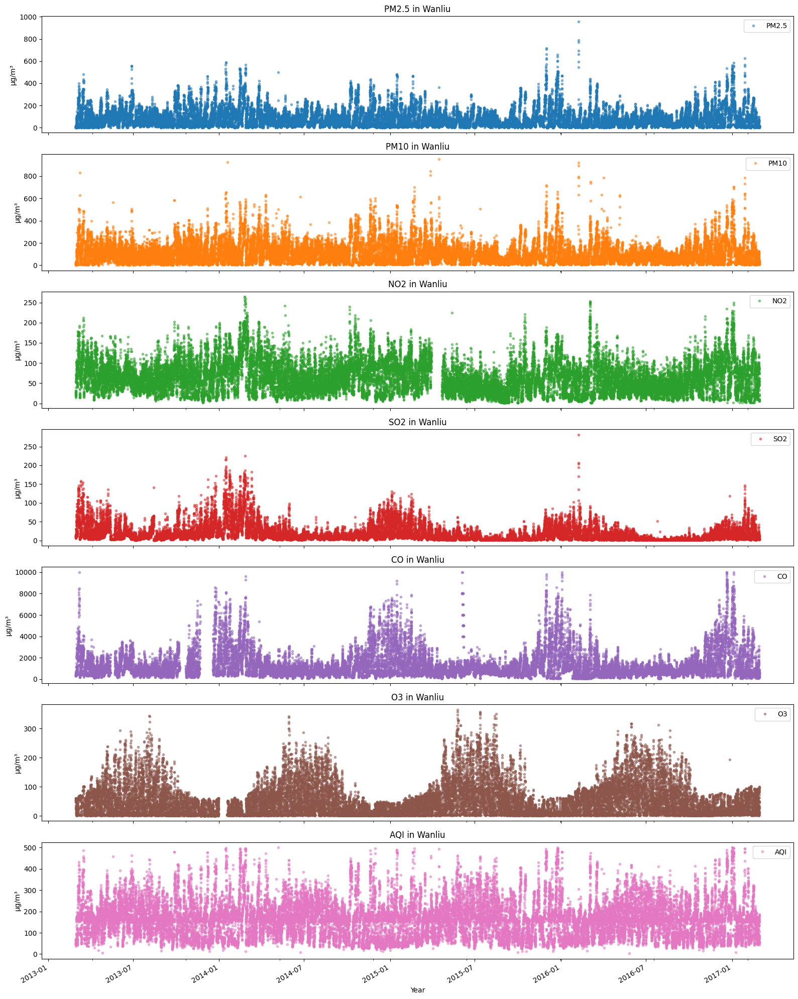

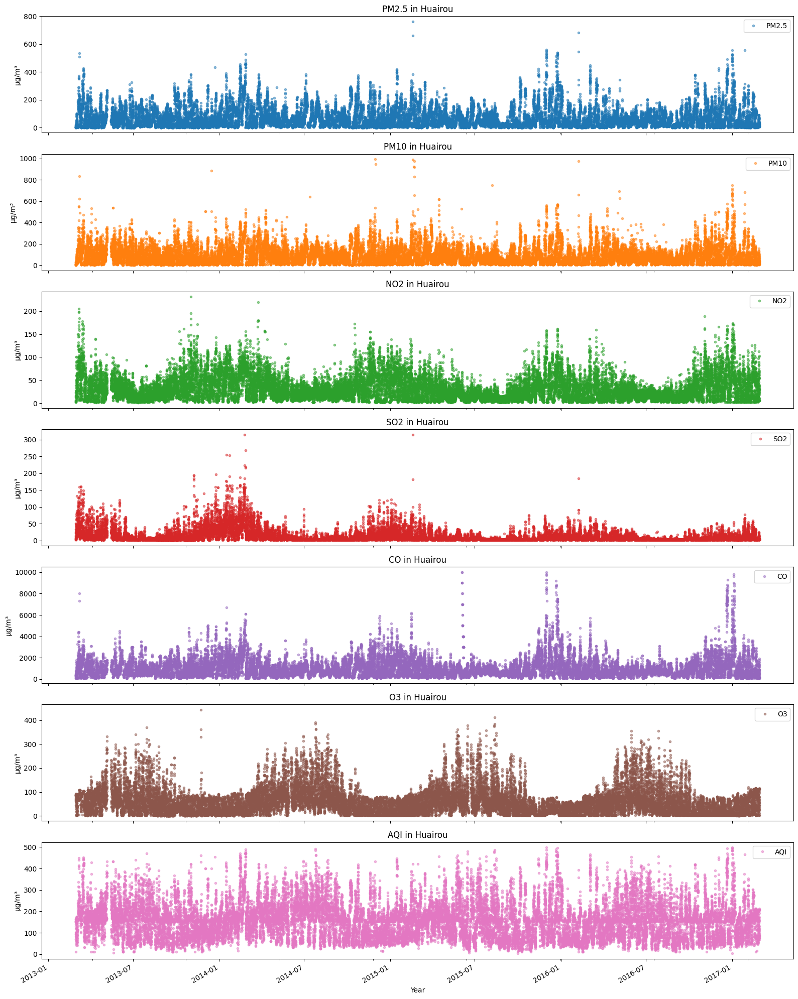

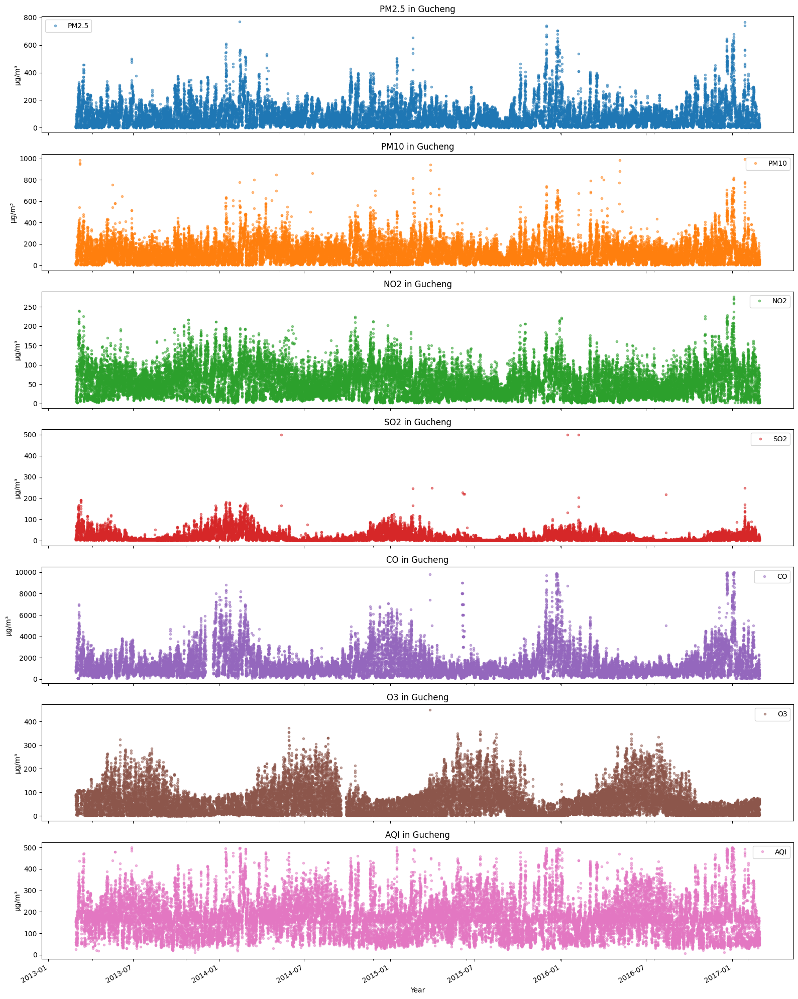

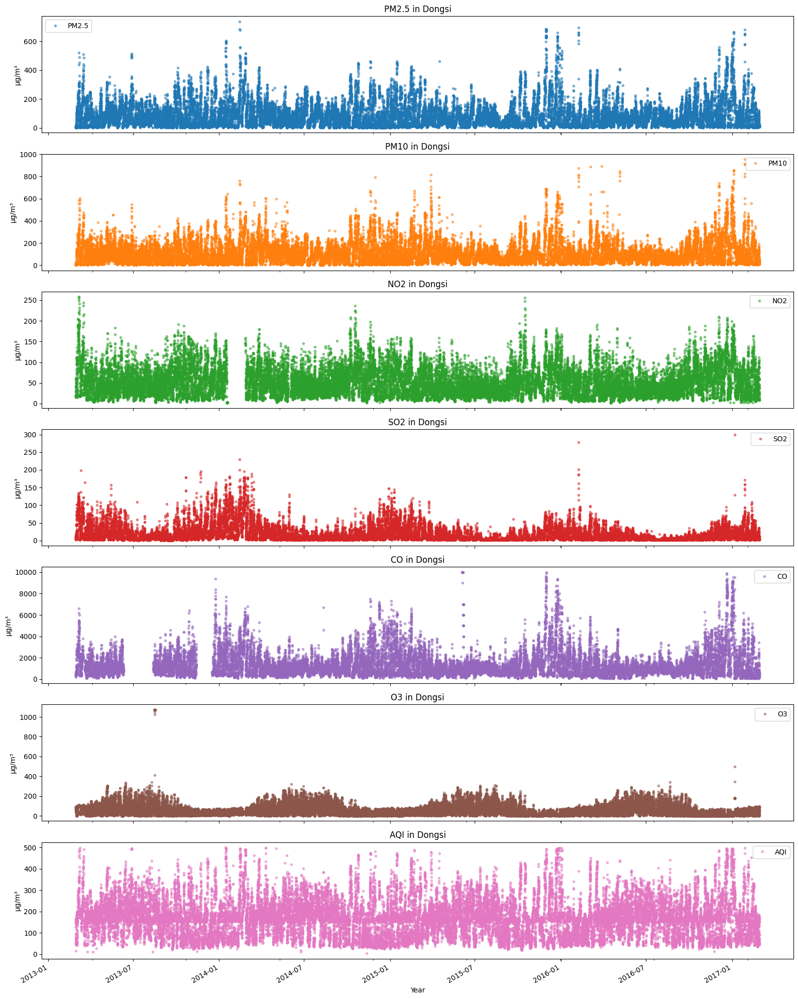

In [33]:
import matplotlib.pyplot as plt

# Ensure 'Date' is a datetime object and set as index
All_Stations_df['Date'] = pd.to_datetime(All_Stations_df['Date'])
All_Stations_df.set_index('Date', inplace=True)

# List of pollutants and cities
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3','AQI']
cities = All_Stations_df['station'].unique()

# Create subplots for each pollutant per city
for station in cities:
    city_data = All_Stations_df[All_Stations_df['station'] == station]

    axes = city_data[pollutants].plot(
        marker='.',
        alpha=0.5,
        linestyle='None',
        figsize=(16, 20),
        subplots=True,
        title=[f"{pollutant} in {station}" for pollutant in pollutants]
    )

    for ax in axes:
        ax.set_xlabel('Year')
        ax.set_ylabel('µg/m³')

    plt.tight_layout()
    plt.show()


# MONTHWISE PLOTTING

In [34]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

All_Stations_df.reset_index(inplace=True)  # Moves 'Date' from index to a column

# Ensure 'Date' column is datetime type
All_Stations_df['Date'] = pd.to_datetime(All_Stations_df['Date'], errors='coerce')

# Convert pollutant columns to numeric, coercing errors to NaN
pollutant_columns = ['PM2.5', 'PM10', 'NO2', 'CO', 'SO2', 'O3', 'AQI']
for col in pollutant_columns:
    All_Stations_df[col] = pd.to_numeric(All_Stations_df[col], errors='coerce')

# Remove rows with NaN values (if needed)
#df1 = df1.dropna(subset=pollutant_columns)

# Grouping by year and month, and calculating mean for each pollutant
All_Stations_df['Month'] = All_Stations_df['Date'].dt.to_period('M')
df_monthly = All_Stations_df.groupby('Month')[pollutant_columns].mean()

# Create subplots: one for each pollutant
fig = make_subplots(
    rows=1, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.03,
    subplot_titles=["Pollutant Levels by Month"]
)

# Adding line plot for each pollutant
for pollutant in pollutant_columns:
    fig.add_trace(
        go.Scatter(
            x=df_monthly.index.astype(str),  # Convert PeriodIndex to string for x-axis
            y=df_monthly[pollutant],
            mode='lines+markers',  # You can change to 'lines' or 'markers' depending on the style
            name=pollutant
        )
    )

# Update layout for better readability
fig.update_layout(
    title="Month-wise Pollutant Levels",
    xaxis_title="Month",
    yaxis_title="Pollutant Concentration (µg/m³)",
    height=600,
    showlegend=True
)

# Show plot
fig.show()

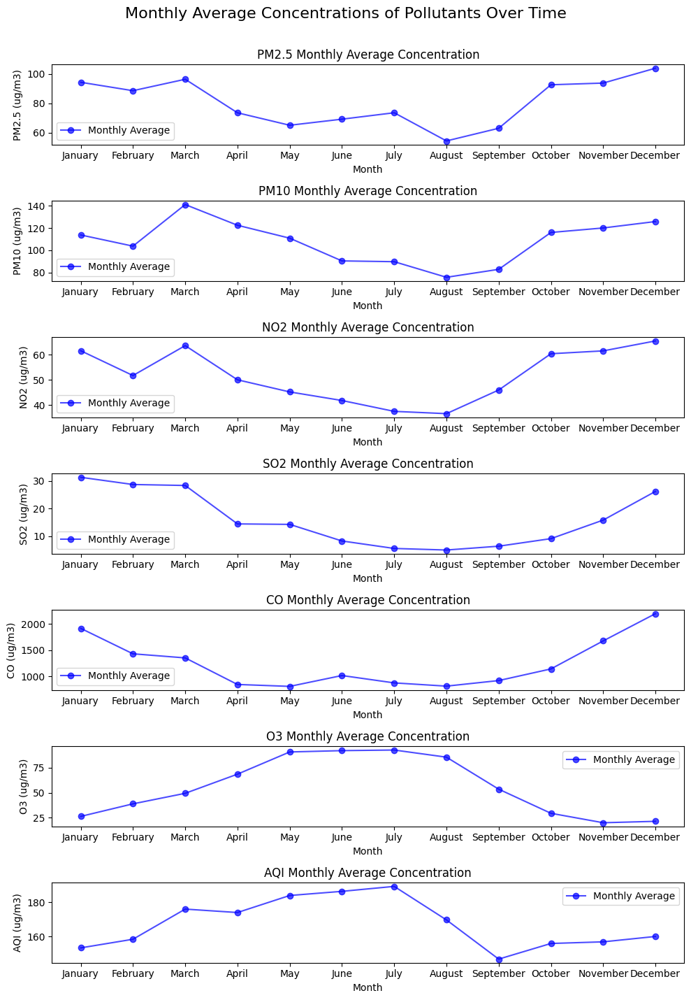

In [35]:
# Group by Month to calculate the monthly average for each pollutant
monthly_avg = df.groupby('month')[pollutants].mean()

# Plotting the monthly average for each pollutant
fig, axes = plt.subplots(len(pollutants), 1, figsize=(10, 15), sharex=False)

# Define month names for x-axis labels
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

for i, pollutant in enumerate(pollutants):
    ax = axes[i]
    ax.plot(month_names, monthly_avg[pollutant], marker='o', linestyle='-', color='blue', alpha=0.7, label='Monthly Average')
    ax.set_ylabel(f'{pollutant} (ug/m3)')
    ax.set_title(f'{pollutant} Monthly Average Concentration')
    ax.legend()
    ax.set_xlabel('Month')  # Set x-axis label

# Adjust spacing between subplots
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Set a common title for the figure
fig.suptitle('Monthly Average Concentrations of Pollutants Over Time', fontsize=16)

plt.show()

**POLLUTANTS BY THE YEAR**

In [36]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#df1.reset_index(inplace=True)  # Moves 'Date' from index to a column

# Ensure 'Date' column is in datetime type
All_Stations_df['Date'] = pd.to_datetime(All_Stations_df['Date'], errors='coerce')

# Convert pollutant columns to numeric, coercing errors to NaN
pollutant_columns = ['PM2.5','PM10', 'NO2', 'SO2', 'CO','O3','AQI']
for col in pollutant_columns:
    All_Stations_df[col] = pd.to_numeric(All_Stations_df[col], errors='coerce')

# Remove rows with NaN values (if needed)
All_Stations_df= All_Stations_df.dropna(subset=pollutant_columns)

# Grouping by year, and calculating mean for each pollutant
All_Stations_df['year'] = All_Stations_df['Date'].dt.year
df_yearly = New_df.groupby('year')[pollutant_columns].mean()

# Create subplots: one for each pollutant
fig = make_subplots(
    rows=1, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.03,
    subplot_titles=["Yearly Pollutant Levels"]
)

# Adding line plot for each pollutant
for pollutant in pollutant_columns:
    fig.add_trace(
        go.Scatter(
            x=df_yearly.index.astype(str),  # Convert Year to string for x-axis
            y=df_yearly[pollutant],
            mode='lines+markers',  # You can change to 'lines' or 'markers' depending on the style
            name=pollutant
        )
    )

# Update layout for better readability
fig.update_layout(
    title="Yearly Pollutant Levels",
    xaxis_title="Year",
    yaxis_title="Pollutant Concentration (µg/m³)",
    height=600,
    showlegend=True
)

# Show plot
fig.show()


In [37]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Assuming df1 and pollutants are already defined
# Group by Year and Month to calculate the monthly average for each pollutant
monthly_avg = All_Stations_df.groupby(['year', 'month'])[pollutants].mean().reset_index()

# Create a Date column from Year and Month
monthly_avg['Date'] = pd.to_datetime(monthly_avg[['year', 'month']].assign(DAY=1))

# Create subplots for each pollutant
fig = make_subplots(rows=len(pollutants), cols=1, subplot_titles=[f'{pollutant} Monthly Average Concentration Over Time' for pollutant in pollutants])

# Add traces for each pollutant
for i, pollutant in enumerate(pollutants):
    fig.add_trace(
        go.Scatter(
            x=monthly_avg['Date'],
            y=monthly_avg[pollutant],
            mode='lines+markers',
            name=pollutant,
            line=dict(color='blue', width=2),
            marker=dict(size=8),
            opacity=0.7
        ),
        row=i+1, col=1
    )

# Update layout
fig.update_layout(
    title_text='Monthly Average Concentrations of Pollutants Over Time',
    title_font_size=24,
    showlegend=False,
    height=300 * len(pollutants),  # Adjust height based on the number of pollutants
    width=1000
)

# Update y-axis labels
for i, pollutant in enumerate(pollutants):
    fig.update_yaxes(title_text=f'{pollutant} (ug/m3)', row=i+1, col=1)

# Update x-axis labels
fig.update_xaxes(title_text='Date', row=len(pollutants), col=1)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Show the plot
fig.show()

In [38]:
monthly_avg

,year,month,PM2.5,PM10,NO2,SO2,CO,O3,AQI,Date
0,2013,3,108.839953,138.960864,74.126947,39.694315,1542.509735,54.615654,186.816199,2013-03-01
1,2013,4,66.532941,106.780000,51.939536,22.565042,924.354118,61.929673,166.521961,2013-04-01
2,2013,5,86.039384,134.562698,54.019466,27.602988,1035.006790,89.881538,197.173834,2013-05-01
3,2013,6,105.587870,124.735435,54.412600,14.594300,1457.051098,69.336199,199.422159,2013-06-01
4,2013,7,71.463784,88.789189,41.593297,6.538317,933.392432,76.536728,180.843243,2013-07-01
5,2013,8,61.624607,85.115173,41.632434,8.267895,868.985849,80.809355,167.917060,2013-08-01
6,2013,9,79.373237,96.985895,55.106692,10.009749,1163.537794,47.670886,162.321157,2013-09-01
7,2013,10,96.089521,113.077217,64.144842,16.763713,1228.383538,30.417482,161.561307,2013-10-01
8,2013,11,72.162192,88.397808,57.838581,21.240548,1251.616438,28.907551,137.856986,2013-11-01
9,2013,12,77.248848,93.533246,62.533904,41.951284,1818.564845,27.101008,146.752469,2013-12-01


# Pollutants with the highest level

In [39]:
pollutants = ['PM2.5', 'PM10', 'NO2', 'CO', 'SO2', 'O3']
pol=New_df[pollutants].mean()
pollutants_df=pol.to_frame().reset_index()
pollutants_df.columns=['Pollutant','Level']
pollutants_df

,Pollutant,Level
0,PM2.5,80.304979
1,PM10,107.521373
2,NO2,51.672113
3,CO,1228.289606
4,SO2,15.951079
5,O3,55.530999


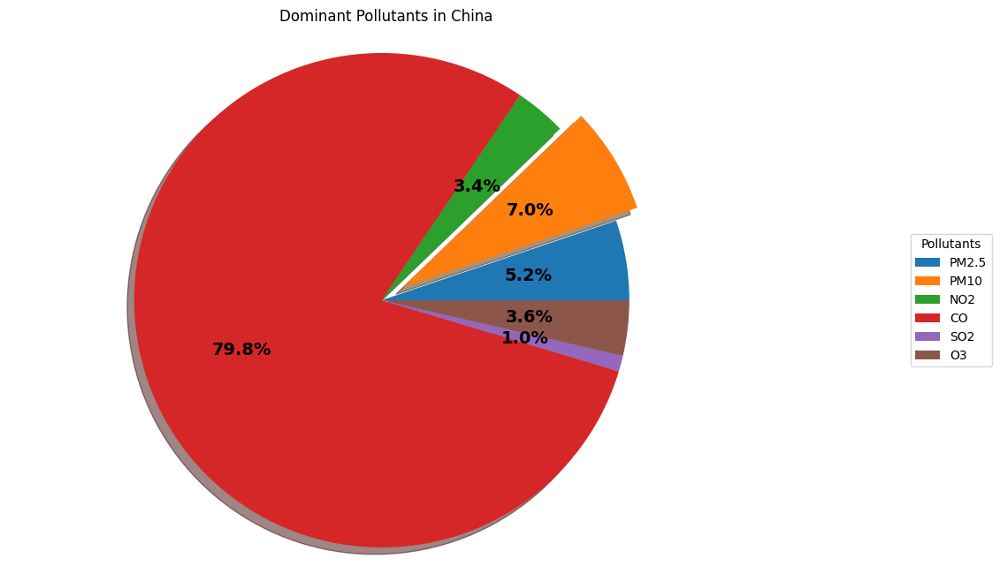

In [40]:
plt.figure(figsize=(11,8))

labels = pollutants_df['Pollutant']
explode = [0, 0.1, 0, 0, 0, 0]  # Exploding the first slice (PM2.5)

plt.title('Dominant Pollutants in China')
wedges, texts, autotexts = plt.pie(
    pollutants_df['Level'],
    explode=explode,
    autopct='%1.1f%%',
    shadow=True,
    startangle=0
)

plt.axis('equal')  # Ensures the pie chart is drawn as a circle

# Adding legend
plt.legend(
    wedges,
    labels,
    title="Pollutants",
    loc="center",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Setting the properties of the percentage texts
plt.setp(autotexts, size=14, weight='bold')

# Display the plot
plt.show()

**Pollution according to city**

In [41]:
import pandas as pd

pollutants = ['PM2.5', 'PM10', 'NO2', 'CO', 'SO2', 'O3']

# Group data by 'State' and calculate the mean of each pollutant
station_pollution_means =New_df.groupby('station')[pollutants].mean()

# Find the dominant pollutant in each state
dominant_pollutant_by_station = station_pollution_means.idxmax(axis=1)

# Convert the result to a DataFrame for better readability
dominant_pollutant_df = dominant_pollutant_by_station.reset_index()
dominant_pollutant_df.columns = ['station', 'Dominant Pollutant']

# Display the results
dominant_pollutant_df


,station,Dominant Pollutant
0,Dongsi,CO
1,Gucheng,CO
2,Huairou,CO
3,Wanliu,CO


## Pollution of stations based on pollutants

In [42]:
def max_polluted_station(pollutants):
    x1 = All_Stations_df[[pollutants,'station']].groupby(["station"]).mean().sort_values(by=pollutants,ascending=False).reset_index()
    x1[pollutants] = round(x1[pollutants],2)
    return x1[:10].style.background_gradient(cmap='OrRd')

In [43]:
from IPython.display import display_html

def display_side_by_side(*args):
    # Convert each DataFrame's Styler object to HTML and join them together
    html_str = ''
    for df in args:
        html_str += df._repr_html_()  # Use _repr_html_ to get the HTML representation
    display_html(html_str.replace('table', 'table style="display:inline;margin-right:20px;"'), raw=True)

# Example usage with your top pollutant DataFrames
pm2_5 =  max_polluted_station('PM2.5')
pm10 =  max_polluted_station('PM10')
no2 =  max_polluted_station('NO2')
so2 =  max_polluted_station('SO2')
co =  max_polluted_station('CO')
ozone= max_polluted_station('O3')
air_qua= max_polluted_station('AQI')

# Display the DataFrames side by side
display_side_by_side(pm2_5, pm10, no2, so2, co, ozone,air_qua)

,station,PM2.5
0,Dongsi,84.980000
1,Gucheng,83.960000
2,Wanliu,81.990000
3,Huairou,70.420000
,station,PM10
0,Gucheng,119.150000
1,Dongsi,111.050000
2,Wanliu,108.770000
3,Huairou,92.570000
,station,NO2


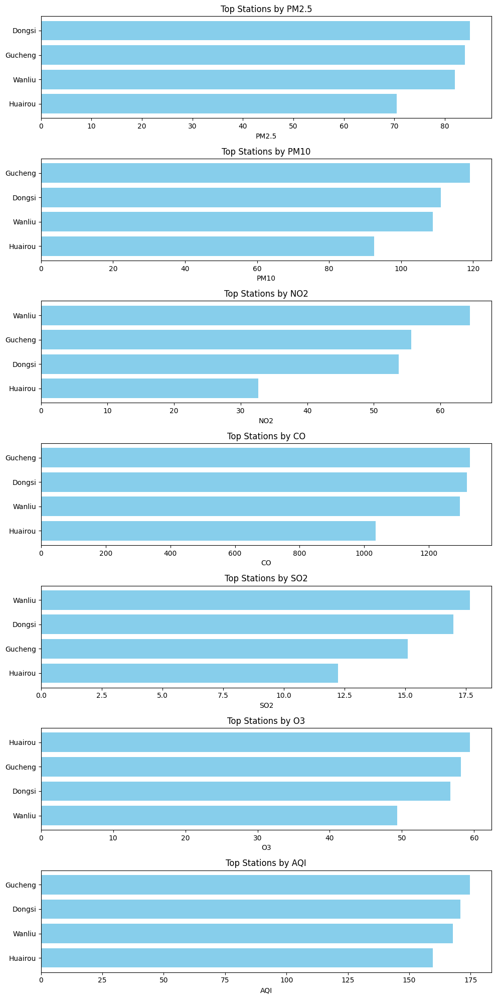

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with pollutant data
pollutant_columns = ['PM2.5','PM10','NO2','CO', 'SO2','O3','AQI']

# Step 1: Group by city and calculate mean pollutant concentrations
mean_pollutant_by_station = All_Stations_df.groupby('station')[pollutant_columns].mean()

# Step 2: Find the top 10 cities for each pollutant
top_station = {}
for pollutant in pollutant_columns:
    top_station[pollutant] = mean_pollutant_by_station[pollutant].sort_values(ascending=False).head(10)
# Step 3: Plotting
fig, axes = plt.subplots(len(pollutant_columns), 1, figsize=(10, 20))

for i, pollutant in enumerate(pollutant_columns):
    axes[i].barh(top_station[pollutant].index, top_station[pollutant].values, color='skyblue')
    axes[i].set_title(f'Top Stations by {pollutant}')
    axes[i].set_xlabel(f'{pollutant}')
    axes[i].invert_yaxis()  # Highest values on top

plt.tight_layout()
plt.show()


Based on the AQI

In [45]:
import pandas as pd

# Assuming 'df' is your DataFrame containing the data

# Calculate the average AQI for each city
average_aqi_by_station = df.groupby('station')['AQI'].mean().reset_index()

# Sort the cities by average AQI in descending order to find the most polluted
most_polluted_station = average_aqi_by_station.sort_values(by='AQI', ascending=False)

# Display the top 10 most polluted cities
top_most_polluted_station = most_polluted_station.head()
print(top_most_polluted_station)

   station         AQI
1  Gucheng  173.453732
0   Dongsi  171.592783
3   Wanliu  166.833137
2  Huairou  158.492327


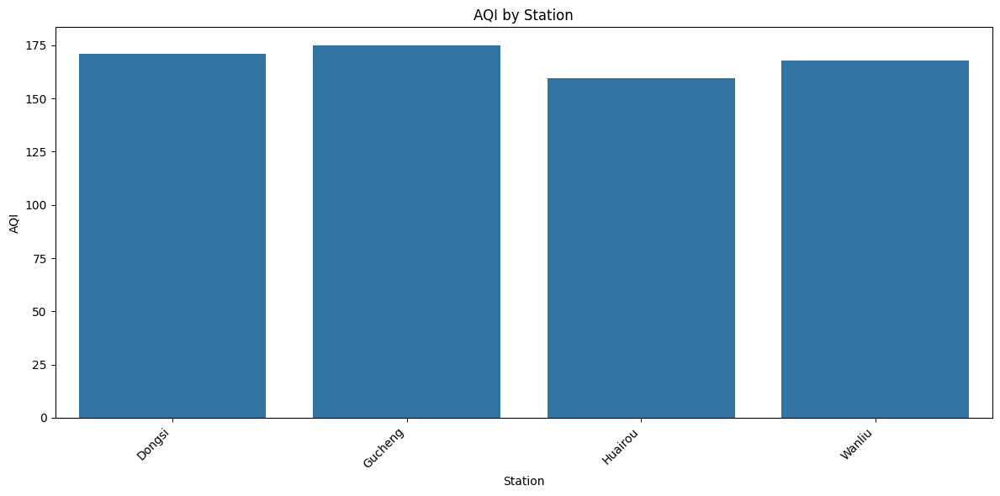

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the average AQI for each station
avg_aqi_by_station = All_Stations_df.groupby('station')['AQI'].mean().reset_index()

# Create the bar plot using the aggregated data
plt.figure(figsize=(12, 6))
sns.barplot(data=avg_aqi_by_station, x='station', y='AQI' )
plt.xticks(rotation=45, ha='right')
plt.title('AQI by Station')
plt.xlabel('Station')
plt.ylabel('AQI')
plt.tight_layout()
plt.show()

# CORRELATION

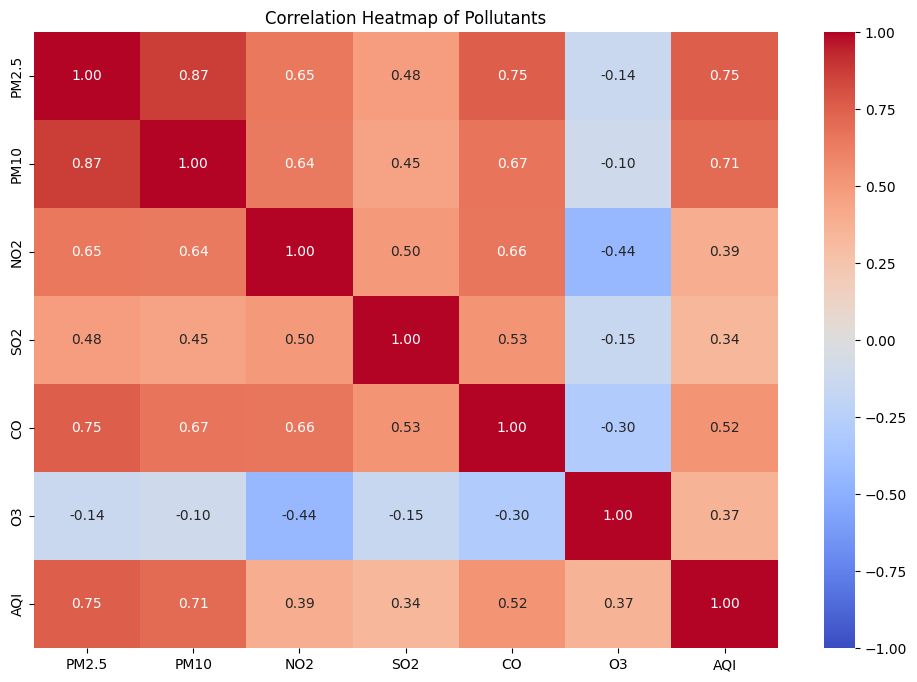

In [47]:
# Filter the DataFrame to include only numeric columns
# This assumes you want to include only the pollutants columns
pollutants = ['PM2.5','PM10', 'NO2', 'SO2', 'CO','O3','AQI']
numeric_pollutants_df = New_df[pollutants]

# Convert data to numeric (this will handle any non-numeric values)
numeric_pollutants_df = numeric_pollutants_df.apply(pd.to_numeric, errors='coerce')

# Drop rows with any NaN values (if any)
numeric_pollutants_df = numeric_pollutants_df

# Calculate the correlation matrix
correlation_matrix = numeric_pollutants_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Pollutants')
plt.show()


In [48]:
numeric_pollutants_df.corr()

,PM2.5,PM10,NO2,SO2,CO,O3,AQI
PM2.5,1.000000,0.873248,0.648758,0.482909,0.753693,-0.138333,0.754265
PM10,0.873248,1.000000,0.643708,0.446556,0.666525,-0.102773,0.710387
NO2,0.648758,0.643708,1.000000,0.496466,0.663670,-0.438335,0.392192
SO2,0.482909,0.446556,0.496466,1.000000,0.525397,-0.153708,0.338649
CO,0.753693,0.666525,0.663670,0.525397,1.000000,-0.295855,0.523692
O3,-0.138333,-0.102773,-0.438335,-0.153708,-0.295855,1.000000,0.365745
AQI,0.754265,0.710387,0.392192,0.338649,0.523692,0.365745,1.000000


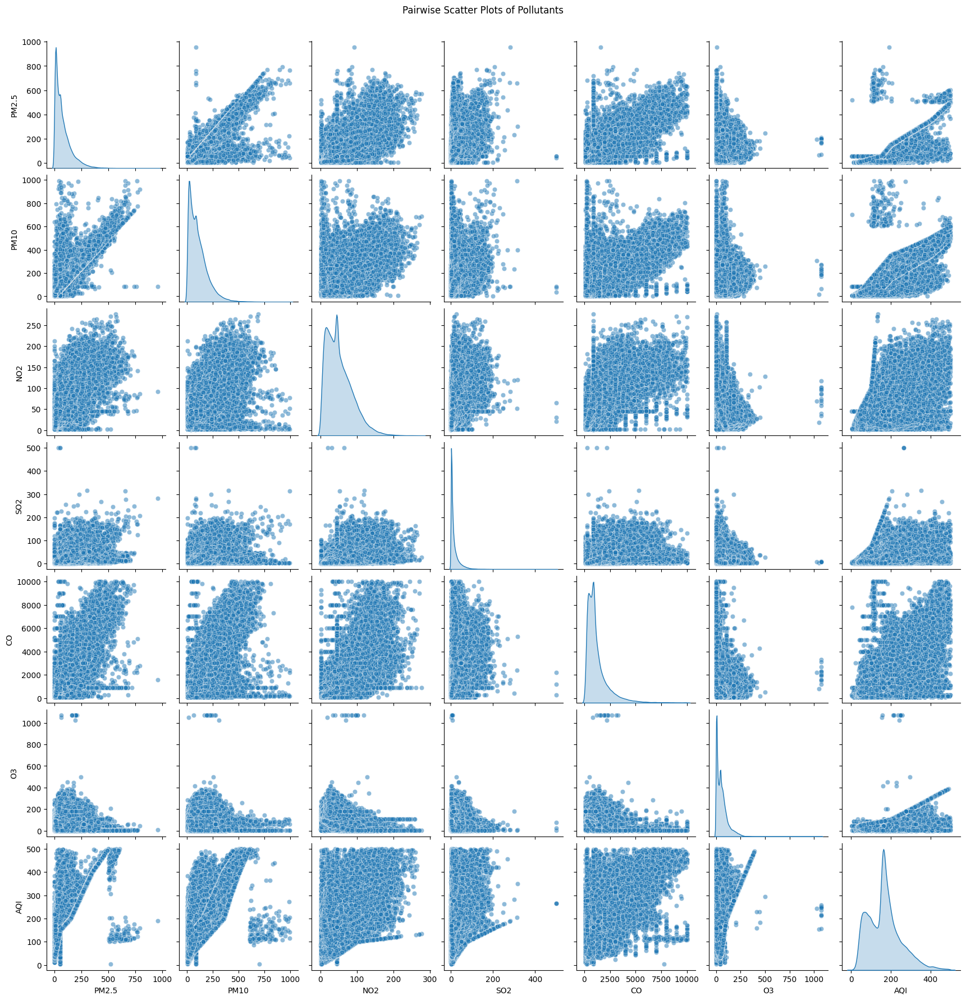

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df1 is your DataFrame and it contains the pollutant columns
pollutants = ['PM2.5','PM10', 'NO2', 'SO2', 'CO', 'O3','AQI']

# Filter the DataFrame to include only the pollutant columns
pollutants_df = New_df[pollutants]

# Ensure all columns are numeric
pollutants_df = pollutants_df.apply(pd.to_numeric, errors='coerce')

# Drop rows with NaN values
pollutants_df = pollutants_df.dropna()

# Create scatter plots between each pair of pollutants
# Use pairplot from seaborn to plot all pairwise scatter plots
sns.pairplot(pollutants_df, diag_kind='kde', plot_kws={'alpha':0.5})
plt.suptitle('Pairwise Scatter Plots of Pollutants', y=1.02)
plt.show()

OBSERVATION AND DISCUSSION

In [51]:
Gucheng_df=Pollutants_df[Pollutants_df.station == 'Gucheng']
Dongsi_df=Pollutants_df[Pollutants_df.station == 'Dongsi']
Wanliu_df=Pollutants_df[Pollutants_df.station == 'Wanliu']
Huairou_df=Pollutants_df[Pollutants_df.station == 'Huairou']


In [52]:
Gucheng_df

,year,month,station,PM2.5,PM10,SO2,NO2,CO,O3,AQI
1,2013,3,Gucheng,108.841398,146.047043,38.080970,74.211185,1592.159946,59.037477,190.342742
5,2013,4,Gucheng,65.227778,109.220833,18.941418,52.172877,932.981944,61.887827,166.562500
9,2013,5,Gucheng,81.846774,149.892473,21.749585,59.261965,974.665323,83.432195,191.776882
13,2013,6,Gucheng,102.452778,131.891667,9.216663,62.445862,1440.559722,72.132809,197.197222
17,2013,7,Gucheng,63.303763,83.459677,4.585435,47.428525,985.202957,73.339081,169.623656
21,2013,8,Gucheng,58.678763,89.659946,3.807796,44.570115,904.435484,81.012727,171.381720
25,2013,9,Gucheng,80.225000,100.490278,6.666652,61.295049,1176.238889,45.861594,163.652778
29,2013,10,Gucheng,95.950269,120.115591,10.874942,75.313418,1244.086022,27.610338,163.030914
33,2013,11,Gucheng,77.337500,93.825000,20.662500,64.262500,1552.638889,27.135182,142.601389
37,2013,12,Gucheng,81.302419,99.108871,40.206701,71.076843,1625.000000,27.169026,151.233871


In [53]:
Wanliu_df

,year,month,station,PM2.5,PM10,SO2,NO2,CO,O3,AQI
3,2013,3,Wanliu,110.272849,145.266801,43.342290,88.142383,1621.081989,39.775633,178.142473
7,2013,4,Wanliu,66.359722,108.365278,25.767200,72.145656,912.152778,50.866604,153.770833
11,2013,5,Wanliu,92.913978,129.952957,24.672043,70.102151,961.385753,64.878101,185.704301
15,2013,6,Wanliu,120.284722,114.116667,19.524694,66.940227,1615.344444,60.925056,207.144444
19,2013,7,Wanliu,75.774194,80.266129,9.233296,54.239517,843.268817,66.063433,180.954301
23,2013,8,Wanliu,67.021505,85.690860,15.663152,57.043234,797.983871,69.106891,172.333333
27,2013,9,Wanliu,86.763889,102.354167,13.324430,67.337059,1066.245833,41.120153,168.931944
31,2013,10,Wanliu,103.918011,126.795699,22.409726,75.276749,1200.940860,29.657531,168.735215
35,2013,11,Wanliu,87.269444,112.988889,21.647222,58.156048,1372.083333,34.344437,143.961111
39,2013,12,Wanliu,104.189516,116.008065,39.753935,73.222323,1510.349462,25.141252,166.104839


In [54]:
Dongsi_df

,year,month,station,PM2.5,PM10,SO2,NO2,CO,O3,AQI
0,2013,3,Dongsi,108.361559,130.901882,39.618028,76.689965,1426.864247,59.245730,191.345430
4,2013,4,Dongsi,65.261111,98.572222,22.344370,43.971195,963.386111,69.279547,171.512500
8,2013,5,Dongsi,91.229839,131.985215,31.584677,52.147849,1139.426075,96.820496,202.811828
12,2013,6,Dongsi,105.690278,115.627778,20.751574,55.977794,1171.609722,86.948586,207.423611
16,2013,7,Dongsi,73.090054,80.931452,9.312743,47.379920,900.000000,82.165572,188.762097
20,2013,8,Dongsi,64.142473,86.329301,9.346635,44.500858,1023.521505,103.754698,176.877688
24,2013,9,Dongsi,85.270833,100.176389,11.976084,59.968613,1372.355556,53.541747,170.725000
28,2013,10,Dongsi,101.405914,108.861559,23.101188,71.981737,1342.607527,32.681179,165.317204
32,2013,11,Dongsi,83.047222,99.488889,27.198611,59.895833,1122.222222,24.336136,140.887500
36,2013,12,Dongsi,85.682796,94.555108,40.992558,61.881902,1326.478495,23.135655,145.615591


In [55]:
Huairou_df

,year,month,station,PM2.5,PM10,SO2,NO2,CO,O3,AQI
2,2013,3,Huairou,97.048387,117.869624,32.972457,51.224313,1187.120968,61.778090,179.905914
6,2013,4,Huairou,57.494444,94.815278,19.264954,35.980193,795.093056,72.718563,171.055556
10,2013,5,Huairou,67.623656,121.388441,19.326026,40.508021,923.486559,88.460235,187.659946
14,2013,6,Huairou,76.095833,115.154167,10.040029,28.544424,1148.933333,67.311210,165.959722
18,2013,7,Huairou,62.099462,86.080645,5.315822,24.238645,881.172043,84.240980,171.510753
22,2013,8,Huairou,56.197581,75.088710,4.219660,21.772601,746.102151,71.295652,155.556452
26,2013,9,Huairou,68.976389,89.170833,7.900187,32.144557,1003.884722,48.998948,147.533333
30,2013,10,Huairou,77.506720,97.401882,10.677801,41.718268,927.822581,37.139144,142.036290
34,2013,11,Huairou,58.551389,75.438889,19.751389,48.020833,982.916667,38.218548,132.538889
38,2013,12,Huairou,59.767473,72.418011,35.832980,47.286384,1352.150538,31.021459,135.322581


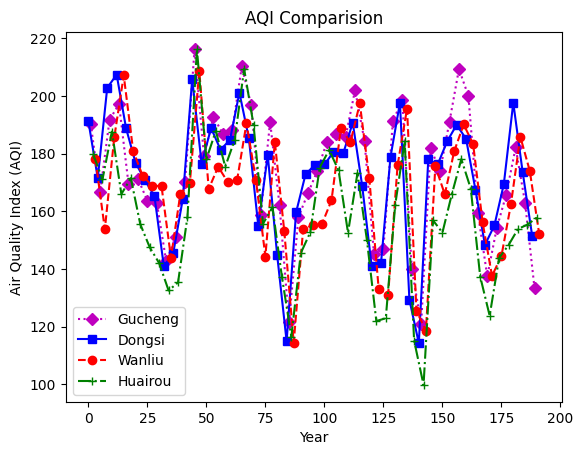

In [56]:
plt.plot(Gucheng_df.index,Gucheng_df.AQI,'D:m')
plt.plot(Dongsi_df.index,Dongsi_df.AQI,'s-b')
plt.plot(Wanliu_df.index,Wanliu_df.AQI,'o--r')
plt.plot(Huairou_df.index,Huairou_df.AQI,'+-.g')

plt.title('AQI of Stations')

plt.xlabel('Year')
plt.ylabel('Air Quality Index (AQI)')

plt.title('AQI Comparision')
plt.legend(['Gucheng','Dongsi','Wanliu','Huairou']);

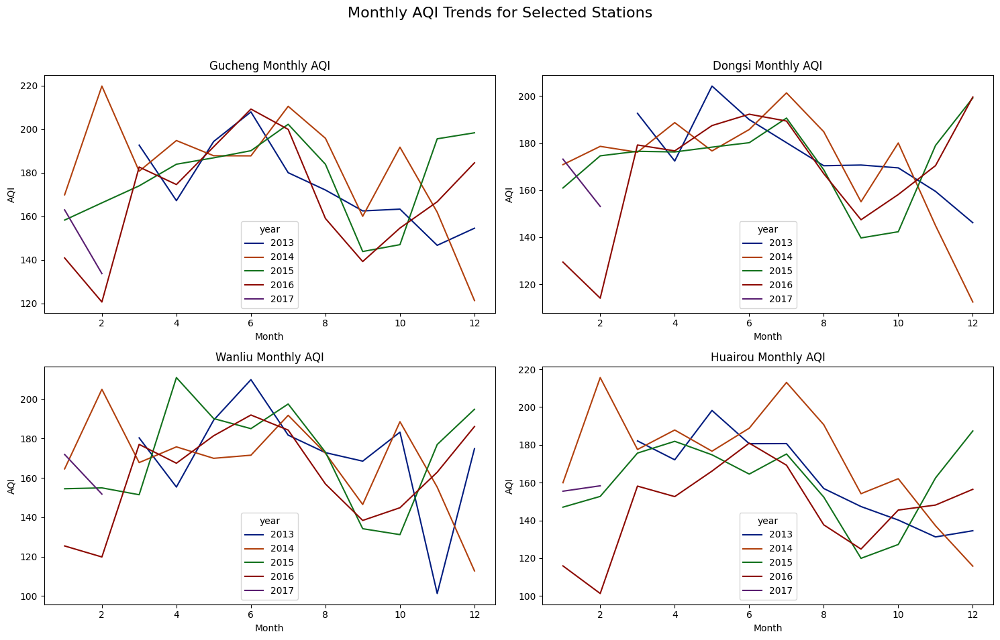

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the cities you're interested in
stations_ = ['Gucheng', 'Dongsi', 'Wanliu', 'Huairou',]

# Create a figure with 5 subplots (one for each city)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()  # Flatten the axes array for easier indexing
fig.suptitle('Monthly AQI Trends for Selected Stations', fontsize=16)

for i, station in enumerate(stations_):
    Station_df = All_Stations_df[All_Stations_df['station'] == station]

    # Group by 'Year' and 'month' and calculate the mean for AQI
    station_monthly_avg = Station_df.groupby(['year', 'month'])['AQI'].mean().reset_index()

    # Plotting the AQI trend for each city
    sns.lineplot(
        data=station_monthly_avg,
        x='month', y='AQI', hue='year', palette='dark',
        markers=True, dashes=False, ax=axes[i]
    )
    axes[i].set_title(f'{station} Monthly AQI')
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('AQI')

# Hide the last subplot if not used
if len(stations_) % 2 != 0:
    fig.delaxes(axes[-1])

# Adjust the layout to make room for the titles and labels
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

In [64]:
aqi_df=All_Stations_df[['AQI','AQI_Bucket']]
aqi_df

,AQI,AQI_Bucket
0,48.0,Good
1,46.0,Good
5,50.0,Good
6,48.0,Good
7,44.0,Good
...,...,...
140251,108.0,Unhealthy for Sensitive Groups
140252,63.0,Moderate
140253,74.0,Moderate
140254,74.0,Moderate


In [65]:
aqi_df.dropna()

,AQI,AQI_Bucket
0,48.0,Good
1,46.0,Good
5,50.0,Good
6,48.0,Good
7,44.0,Good
...,...,...
140251,108.0,Unhealthy for Sensitive Groups
140252,63.0,Moderate
140253,74.0,Moderate
140254,74.0,Moderate


In [66]:
aqi_df.AQI_Bucket.value_counts()

,count
AQI_Bucket,
Unhealthy,40809
Very Unhealthy,26845
Moderate,23619
Unhealthy for Sensitive Groups,18557
Hazardous,9313
Good,6712


# LINEAR REGRESSION

In [69]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Load data (already includes AQI)
df = pd.read_csv("Combined_Stations_with_AQI.csv")

# Drop rows with missing AQI or key inputs
New_df.dropna(subset=['AQI', 'PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3', 'WSPM', 'RAIN','TEMP','PRES','DEWP', 'station', 'Date'], inplace=True)

# Extract month from date
New_df['Date'] = pd.to_datetime(New_df['Date'])
New_df['month'] = New_df['Date'].dt.month

# === Define features and target ===
features = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3', 'WSPM', 'RAIN','TEMP','PRES','DEWP','station', 'month']
target = 'AQI'

X = New_df[features]
y = New_df[target]

# === Handle categorical variables ===
categorical_features = ['station', 'month']
numerical_features = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3', 'WSPM', 'RAIN','TEMP','PRES','DEWP','AQI']

# Preprocessing pipeline
preprocessor = ColumnTransformer(transformers=[
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
], remainder='passthrough')

# Build pipeline with regression model
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# === Train/test split ===
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Train the model ===
model.fit(X_train, y_train)

# === Evaluate the model ===
y_pred = model.predict(X_test)

print("R² Score:", r2_score(y_test, y_pred))
print("RMSE:", mean_squared_error(y_test, y_pred, ))


R² Score: 0.9968860955830354
RMSE: 21.335776625552544


In [70]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 6.1 MB/s eta 0:00:00


In [71]:
!wget -q -O - ipv4.icanhazip.com

34.90.89.54


In [ ]:
import streamlit as st
print('Hello Class')

In [ ]:
!streamlit run app.py & npx localtunnel --port 8501